In [2]:
import warnings
warnings.filterwarnings('ignore')

# pandas and numpy
import pandas as pd
import numpy as np

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
#%matplotlib qt

# sklearn
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import mean_squared_error,confusion_matrix, precision_score, recall_score, auc,roc_curve
from sklearn import ensemble, linear_model, neighbors, svm, tree, neural_network
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import svm,model_selection, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#XGBoost
from xgboost import XGBClassifier
import xgboost as xgb

# stats and scipy
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.formula.api import ols
import scipy.stats as stats
!pip install mlxtend
#confusion matrix library
from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
warnings.filterwarnings('ignore')
df = pd.read_csv('trafficCrashes.csv')

In [3]:
df.head(10)

,CRASH_RECORD_ID,RD_NO,CRASH_DATE_EST_I,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,...,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION
0,0093ab2b8c83148fcc023b643e50f04d0f9a5ec7704a3d...,JD446848,NaN,11/23/2020 03:00:00 AM,30,UNKNOWN,UNKNOWN,UNKNOWN,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,...,0.0,0.0,1.0,0.0,3,2,11,41.887234,-87.721106,POINT (-87.721106403852 41.887233726688)
1,33582a32ce551e411cc4d47dbd973f522628eedb4e7a80...,JA371697,NaN,07/31/2017 06:15:00 PM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR END,...,0.0,0.0,2.0,0.0,18,2,7,41.923098,-87.785279,POINT (-87.785278659431 41.923097678208)
2,3358b8bce8402c6c5aed59e0121cc922d9ff2929c055f9...,JB101938,NaN,12/31/2017 05:48:00 PM,10,NO CONTROLS,NO CONTROLS,CLEAR,DARKNESS,REAR END,...,0.0,0.0,2.0,0.0,17,1,12,41.808815,-87.645683,POINT (-87.645682953152 41.808815039296)
3,3358dc03b2fe52149c5901afd7221a9ebd509e3dfbaf49...,JC366373,NaN,07/27/2019 02:16:00 AM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",ANGLE,...,0.0,0.0,3.0,0.0,2,7,7,41.862315,-87.715448,POINT (-87.715448345409 41.862315114335)
4,33590a8dbdcaf5cd563c396ff131b41effbb5709770006...,JB513610,NaN,11/12/2018 06:50:00 PM,30,STOP SIGN/FLASHER,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",ANGLE,...,0.0,0.0,3.0,0.0,18,2,11,41.886006,-87.620829,POINT (-87.620828956741 41.886005833425)
5,33597323513d6058b5acac8a6118ae968367de2d07ffb2...,HZ547676,Y,12/11/2016 05:30:00 AM,0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,SIDESWIPE SAME DIRECTION,...,0.0,0.0,2.0,0.0,5,1,12,41.901032,-87.648941,POINT (-87.648941050666 41.901032126736)
6,33597a24ed9ab58921e1f7516cc25b94720fd292923e1f...,JA513137,NaN,11/15/2017 04:42:00 PM,35,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DARKNESS,SIDESWIPE SAME DIRECTION,...,0.0,0.0,2.0,0.0,16,4,11,41.750060,-87.682699,POINT (-87.682699127318 41.750060362735)
7,33598244a436f334b1b8759c7d396413f91804615ff4bb...,JA148817,NaN,02/10/2017 02:45:00 PM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,...,0.0,0.0,2.0,0.0,14,6,2,41.752822,-87.741354,POINT (-87.741354493194 41.752822020767)
8,3359a30ac711cb12e281a6eb95a79fdfba11f9f6dc4a04...,JC505529,Y,11/09/2019 01:19:00 PM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,...,0.0,0.0,1.0,0.0,13,7,11,41.891587,-87.725727,POINT (-87.725726955964 41.891586580714)
9,3359b4a28b67f049d1a5673c571c6cd2c75a78788dcc31...,JA375998,NaN,08/03/2017 07:30:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,...,0.0,0.0,1.0,0.0,7,5,8,41.917590,-87.651988,POINT (-87.651987883126 41.917589721448)


In [4]:
df.describe()

,POSTED_SPEED_LIMIT,LANE_CNT,STREET_NO,BEAT_OF_OCCURRENCE,NUM_UNITS,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE
count,463746.000000,1.989600e+05,463746.000000,463741.000000,463746.000000,462821.000000,462821.000000,462821.000000,462821.000000,462821.000000,462821.000000,462821.0,463746.000000,463746.000000,463746.000000,461214.000000,461214.000000
mean,28.297072,1.333274e+01,3633.306275,1242.069358,2.032071,0.176492,0.001057,0.019286,0.097634,0.058515,2.033026,0.0,13.222799,4.127844,6.856178,41.855961,-87.672567
std,6.509234,2.961966e+03,2909.784156,708.335760,0.438574,0.547927,0.035476,0.163034,0.404411,0.311406,1.177632,0.0,5.492835,1.973956,3.418430,0.348257,0.709532
min,0.000000,0.000000e+00,0.000000,111.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,1.000000,0.000000,-87.934763
25%,30.000000,2.000000e+00,1201.000000,713.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,9.000000,2.000000,4.000000,41.784827,-87.721039
50%,30.000000,2.000000e+00,3148.000000,1213.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.0,14.000000,4.000000,7.000000,41.876365,-87.673233
75%,30.000000,4.000000e+00,5534.000000,1823.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.0,17.000000,6.000000,10.000000,41.924321,-87.632840
max,99.000000,1.191625e+06,451100.000000,6100.000000,18.000000,21.000000,4.000000,7.000000,21.000000,15.000000,61.000000,0.0,23.000000,7.000000,12.000000,42.022780,0.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 463746 entries, 0 to 463745
Data columns (total 49 columns):
CRASH_RECORD_ID                  463746 non-null object
RD_NO                            460523 non-null object
CRASH_DATE_EST_I                 34498 non-null object
CRASH_DATE                       463746 non-null object
POSTED_SPEED_LIMIT               463746 non-null int64
TRAFFIC_CONTROL_DEVICE           463746 non-null object
DEVICE_CONDITION                 463746 non-null object
WEATHER_CONDITION                463746 non-null object
LIGHTING_CONDITION               463746 non-null object
FIRST_CRASH_TYPE                 463746 non-null object
TRAFFICWAY_TYPE                  463746 non-null object
LANE_CNT                         198960 non-null float64
ALIGNMENT                        463746 non-null object
ROADWAY_SURFACE_COND             463746 non-null object
ROAD_DEFECT                      463746 non-null object
REPORT_TYPE                      452617 non-null o

In [6]:
df.columns

Index(['CRASH_RECORD_ID', 'RD_NO', 'CRASH_DATE_EST_I', 'CRASH_DATE',
       'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION',
       'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE',
       'TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT', 'ROADWAY_SURFACE_COND',
       'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE', 'INTERSECTION_RELATED_I',
       'NOT_RIGHT_OF_WAY_I', 'HIT_AND_RUN_I', 'DAMAGE', 'DATE_POLICE_NOTIFIED',
       'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO',
       'STREET_DIRECTION', 'STREET_NAME', 'BEAT_OF_OCCURRENCE',
       'PHOTOS_TAKEN_I', 'STATEMENTS_TAKEN_I', 'DOORING_I', 'WORK_ZONE_I',
       'WORK_ZONE_TYPE', 'WORKERS_PRESENT_I', 'NUM_UNITS',
       'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL',
       'INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING',
       'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION',
       'INJURIES_UNKNOWN', 'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH',
       'LA

In [8]:
#droping columns i dont think i need
df1 = df.drop(['RD_NO', 'CRASH_DATE_EST_I','TRAFFIC_CONTROL_DEVICE','DEVICE_CONDITION','FIRST_CRASH_TYPE',
               'TRAFFICWAY_TYPE','LANE_CNT','ALIGNMENT','ROADWAY_SURFACE_COND','ROAD_DEFECT','REPORT_TYPE',
               'NOT_RIGHT_OF_WAY_I','HIT_AND_RUN_I','DATE_POLICE_NOTIFIED','SEC_CONTRIBUTORY_CAUSE','STREET_NO',
               'STREET_DIRECTION','STREET_NAME','BEAT_OF_OCCURRENCE','PHOTOS_TAKEN_I','STATEMENTS_TAKEN_I','DOORING_I',
               'WORK_ZONE_I','WORK_ZONE_TYPE','WORKERS_PRESENT_I','NUM_UNITS','INJURIES_REPORTED_NOT_EVIDENT'
               ,'INJURIES_NO_INDICATION','INJURIES_UNKNOWN','LOCATION','INTERSECTION_RELATED_I'], axis=1)


In [9]:
# drop ambiguous or null data
df1.drop(df1[df1['WEATHER_CONDITION'] == 'UNKNOWN'].index, inplace = True)
df1.drop(df1[df1['WEATHER_CONDITION'] == 'OTHER'].index, inplace = True)
df1.drop(df1[df1['PRIM_CONTRIBUTORY_CAUSE'] == 'UNABLE TO DETERMINE'].index, inplace = True)
df1.drop(df1[df1['PRIM_CONTRIBUTORY_CAUSE'] == 'NOT APPLICABLE'].index, inplace = True)
df1.drop(df1[df1['LIGHTING_CONDITION'] == 'UNKNOWN'].index, inplace = True)

df2 = df1.dropna()
df2.isna().sum()
df2.head()
df2['PRIM_CONTRIBUTORY_CAUSE'].value_counts()

FAILING TO YIELD RIGHT-OF-WAY                                                       50184
FOLLOWING TOO CLOSELY                                                               48377
IMPROPER OVERTAKING/PASSING                                                         21319
IMPROPER BACKING                                                                    19498
FAILING TO REDUCE SPEED TO AVOID CRASH                                              19252
IMPROPER LANE USAGE                                                                 17489
IMPROPER TURNING/NO SIGNAL                                                          15026
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE                                                 13879
DISREGARDING TRAFFIC SIGNALS                                                         8127
WEATHER                                                                              6836
OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER     5517
DISREGARDI

In [10]:
# clean primary contributing factors column, placing each in 1 of 4 categories
df2['PRIM_CONTRIBUTORY_CAUSE'] = df2['PRIM_CONTRIBUTORY_CAUSE'].replace(
    ['FAILING TO YIELD RIGHT-OF-WAY','FOLLOWING TOO CLOSELY','NOT APPLICABLE','IMPROPER OVERTAKING/PASSING',
     'IMPROPER BACKING','FAILING TO REDUCE SPEED TO AVOID CRASH','IMPROPER LANE USAGE','IMPROPER TURNING/NO SIGNALDRIVING SKILLS/KNOWLEDGE/EXPERIENCE',
     'DISREGARDING TRAFFIC SIGNALS','IMPROPER TURNING/NO SIGNAL','DRIVING SKILLS/KNOWLEDGE/EXPERIENCE',
     'OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER','DISREGARDING STOP SIGN',
     'DRIVING ON WRONG SIDE/WRONG WAY','EXCEEDING AUTHORIZED SPEED LIMIT','EXCEEDING SAFE SPEED FOR CONDITIONS',
     'MOTORCYCLE ADVANCING LEGALLY ON RED LIGHT','BICYCLE ADVANCING LEGALLY ON RED LIGHT','DISREGARDING OTHER TRAFFIC SIGNS',
     'DISREGARDING ROAD MARKINGS','TURNING RIGHT ON RED','DISREGARDING YIELD SIGN','RELATED TO BUS STOP','PASSING STOPPED SCHOOL BUS'],
     'DRIVER NEGLIGENCE')
df2['PRIM_CONTRIBUTORY_CAUSE'] = df2['PRIM_CONTRIBUTORY_CAUSE'].replace(
    ['WEATHER','VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.)','DISTRACTION - FROM OUTSIDE VEHICLE',
     'EVASIVE ACTION DUE TO ANIMAL, OBJECT, NONMOTORIST','ANIMAL','EQUIPMENT - VEHICLE CONDITION',
     'ROAD ENGINEERING/SURFACE/MARKING DEFECTS','ROAD CONSTRUCTION/MAINTENANCE','OBSTRUCTED CROSSWALKS'],'EXTERNAL FACTORS')
df2['PRIM_CONTRIBUTORY_CAUSE'] = df2['PRIM_CONTRIBUTORY_CAUSE'].replace(
    ['DISTRACTION - FROM INSIDE VEHICLE','CELL PHONE USE OTHER THAN TEXTING',
    'DISTRACTION - OTHER ELECTRONIC DEVICE (NAVIGATION DEVICE, DVD PLAYER, ETC.)',
    'TEXTING'],'DISTRACTION')
df2['PRIM_CONTRIBUTORY_CAUSE'] = df2['PRIM_CONTRIBUTORY_CAUSE'].replace(
    ['PHYSICAL CONDITION OF DRIVER','UNDER THE INFLUENCE OF ALCOHOL/DRUGS (USE WHEN ARREST IS EFFECTED)',
    'HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE)'
    ],'INTOXICATION')

In [11]:
df2.head()

,CRASH_RECORD_ID,CRASH_DATE,POSTED_SPEED_LIMIT,WEATHER_CONDITION,LIGHTING_CONDITION,CRASH_TYPE,DAMAGE,PRIM_CONTRIBUTORY_CAUSE,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE
1,33582a32ce551e411cc4d47dbd973f522628eedb4e7a80...,07/31/2017 06:15:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,18,2,7,41.923098,-87.785279
3,3358dc03b2fe52149c5901afd7221a9ebd509e3dfbaf49...,07/27/2019 02:16:00 AM,30,CLEAR,"DARKNESS, LIGHTED ROAD",INJURY AND / OR TOW DUE TO CRASH,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,2,7,7,41.862315,-87.715448
4,33590a8dbdcaf5cd563c396ff131b41effbb5709770006...,11/12/2018 06:50:00 PM,30,CLEAR,"DARKNESS, LIGHTED ROAD",INJURY AND / OR TOW DUE TO CRASH,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,18,2,11,41.886006,-87.620829
7,33598244a436f334b1b8759c7d396413f91804615ff4bb...,02/10/2017 02:45:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,14,6,2,41.752822,-87.741354
8,3359a30ac711cb12e281a6eb95a79fdfba11f9f6dc4a04...,11/09/2019 01:19:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,13,7,11,41.891587,-87.725727


In [12]:
# group weather data into similar categories
df2['WEATHER_CONDITION'] = df2['WEATHER_CONDITION'].replace(['BLOWING SNOW','SLEET/HAIL'],'SNOW')
df2['WEATHER_CONDITION'] = df2['WEATHER_CONDITION'].replace(['FREEZING RAIN/DRIZZLE'],'RAIN')
df2 = df2[(df2['WEATHER_CONDITION'] != 'SEVERE CROSS WIND GATE') & (df2['WEATHER_CONDITION'] != 'BLOWING SAND, SOIL, DIRT')]
df2 = df2[(df2['WEATHER_CONDITION'] != 'UNKNOWN') & (df2['WEATHER_CONDITION'] != 'OTHER')]
df2['WEATHER_CONDITION'].value_counts()

CLEAR              212416
RAIN                26872
SNOW                10611
CLOUDY/OVERCAST      8954
FOG/SMOKE/HAZE        519
Name: WEATHER_CONDITION, dtype: int64

In [13]:
df2['INJURIES'] = df2['MOST_SEVERE_INJURY'].copy()
df2['INJURIES'] = df2['INJURIES'].replace(['NONINCAPACITATING INJURY','REPORTED, NOT EVIDENT'],'MINOR INJURY')
df2['INJURIES'] = df2['INJURIES'].replace(['NO INDICATION OF INJURY'],'NO INJURY')

df2.to_csv('cleaned_data.csv')
df2.head()

,CRASH_RECORD_ID,CRASH_DATE,POSTED_SPEED_LIMIT,WEATHER_CONDITION,LIGHTING_CONDITION,CRASH_TYPE,DAMAGE,PRIM_CONTRIBUTORY_CAUSE,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,INJURIES
1,33582a32ce551e411cc4d47dbd973f522628eedb4e7a80...,07/31/2017 06:15:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,18,2,7,41.923098,-87.785279,NO INJURY
3,3358dc03b2fe52149c5901afd7221a9ebd509e3dfbaf49...,07/27/2019 02:16:00 AM,30,CLEAR,"DARKNESS, LIGHTED ROAD",INJURY AND / OR TOW DUE TO CRASH,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,2,7,7,41.862315,-87.715448,NO INJURY
4,33590a8dbdcaf5cd563c396ff131b41effbb5709770006...,11/12/2018 06:50:00 PM,30,CLEAR,"DARKNESS, LIGHTED ROAD",INJURY AND / OR TOW DUE TO CRASH,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,18,2,11,41.886006,-87.620829,NO INJURY
7,33598244a436f334b1b8759c7d396413f91804615ff4bb...,02/10/2017 02:45:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,14,6,2,41.752822,-87.741354,NO INJURY
8,3359a30ac711cb12e281a6eb95a79fdfba11f9f6dc4a04...,11/09/2019 01:19:00 PM,30,CLEAR,DAYLIGHT,NO INJURY / DRIVE AWAY,"OVER $1,500",DRIVER NEGLIGENCE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,13,7,11,41.891587,-87.725727,NO INJURY


In [14]:
not_speed_limits = [0, 1, 2, 3, 4, 6, 7, 9, 11, 12, 14, 18, 22, 23, 24, 26, 29, 31, 32, 33, 34, 36, 38, 39, 49, 63, 65, 99]
data_speeds_cleaned = df2[~df2['POSTED_SPEED_LIMIT'].isin(not_speed_limits)]
speeds = df2['POSTED_SPEED_LIMIT'].value_counts().index.tolist()
print('speeds:' + str(sorted(speeds)))

data_speeds_cleaned['POSTED_SPEED_LIMIT'].value_counts().sort_index()
data_speeds_cleaned['DAMAGE'] = data_speeds_cleaned['DAMAGE'].replace(['$501 - $1,500'],'$500-$1500')

data_speeds_cleaned['POSTED_SPEED_LIMIT'].value_counts()

speeds:[0, 1, 2, 3, 5, 6, 7, 9, 10, 11, 12, 15, 20, 24, 25, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 45, 49, 50, 55, 60, 63, 65, 70, 99]


30    196894
35     19490
25     13595
20      8010
15      7747
10      3891
40      2877
45      1817
5       1534
55       214
50        60
60        13
70         2
Name: POSTED_SPEED_LIMIT, dtype: int64

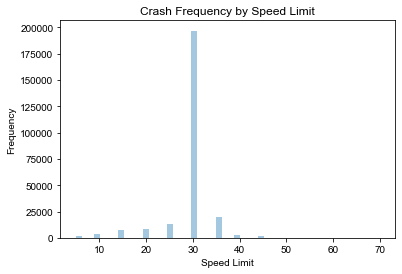

In [15]:
sns.distplot(data_speeds_cleaned['POSTED_SPEED_LIMIT'],kde=False)
sns.set(rc={'figure.figsize':(10,10)})
plt.title('Crash Frequency by Speed Limit')
plt.xlabel('Speed Limit')
plt.ylabel('Frequency');

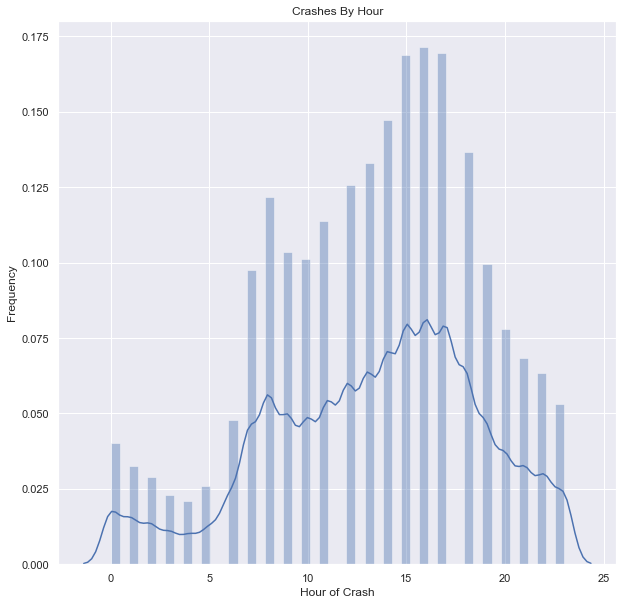

In [16]:
sns.distplot(df2['CRASH_HOUR'])
sns.set(rc={'figure.figsize':(13,8)})
plt.title('Crashes By Hour')
plt.xlabel('Hour of Crash')
plt.ylabel('Frequency');

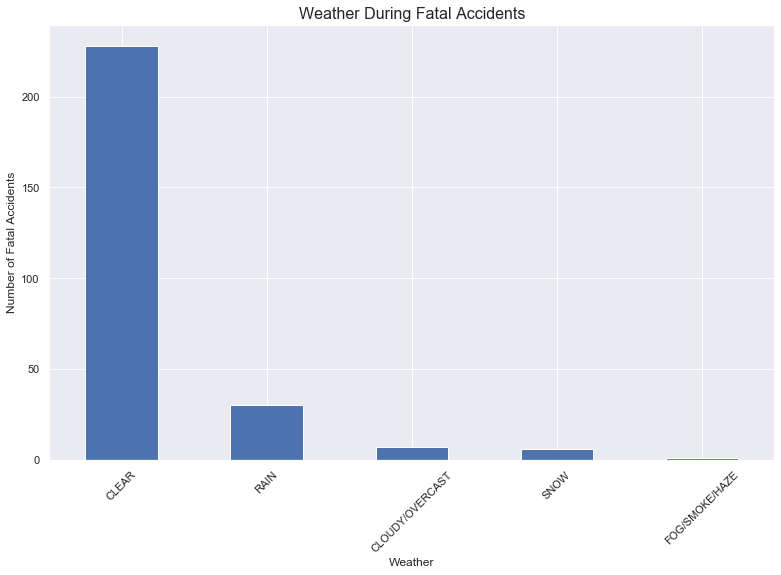

<Figure size 1512x936 with 0 Axes>

In [17]:
df3 = data_speeds_cleaned.groupby(['INJURIES'])
df_fatal = df3.get_group('FATAL')
pd.value_counts(df_fatal['WEATHER_CONDITION']).plot.bar();
plt.title('Weather During Fatal Accidents', fontsize=16)
plt.xticks(rotation=45)
plt.xlabel('Weather', fontsize=12)
plt.ylabel('Number of Fatal Accidents', fontsize=12)
plt.figure(figsize=(21,13))
plt.show()

In [18]:
# group injuries into 4 distinct categories
data__ = data_speeds_cleaned[['PRIM_CONTRIBUTORY_CAUSE','POSTED_SPEED_LIMIT','WEATHER_CONDITION','LIGHTING_CONDITION','DAMAGE','INJURIES','CRASH_HOUR','CRASH_MONTH']].copy()

data__ = pd.get_dummies(data__, columns=['POSTED_SPEED_LIMIT', 'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'DAMAGE','INJURIES'])

data__['PRIM_CONTRIBUTORY_CAUSE'] = data__['PRIM_CONTRIBUTORY_CAUSE'].replace(['DRIVER NEGLIGENCE'], '0')
data__['PRIM_CONTRIBUTORY_CAUSE'] = data__['PRIM_CONTRIBUTORY_CAUSE'].replace(['EXTERNAL FACTORS'], '1')
data__['PRIM_CONTRIBUTORY_CAUSE'] = data__['PRIM_CONTRIBUTORY_CAUSE'].replace(['INTOXICATION'], '2')
data__['PRIM_CONTRIBUTORY_CAUSE'] = data__['PRIM_CONTRIBUTORY_CAUSE'].replace(['DISTRACTION'], '3')

data__.head()

data__.to_csv('cleaned_dummified_data.csv')

In [ ]:

x = data__.drop(['PRIM_CONTRIBUTORY_CAUSE'], axis=1)
y = data__['PRIM_CONTRIBUTORY_CAUSE']
data__['PRIM_CONTRIBUTORY_CAUSE'].value_counts()

In [19]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.2, random_state=33)

In [20]:
XGBmodel = XGBClassifier()
XGBmodel.fit(x_train, y_train)
y_predict = XGBmodel.predict(x_test)

[15:41:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [21]:
parameters_grid = {
    'colsample_bytree': [0.1, 0.5, 0.8, 1],
    'n_estimators': [25],
    'max_depth': [2, 5, 10, 20]}

# Perform grid search
grid_mse = GridSearchCV(estimator=XGBmodel, param_grid=parameters_grid,
                        scoring='neg_mean_squared_error', cv=5, verbose=1)
grid_mse.fit(x, y)

# print the best parameters and lowest RMSE
print("Best parameters found: ", grid_mse.best_params_)
print("Lowest RMSE found: ", round(np.sqrt(np.abs(grid_mse.best_score_))), 4)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[15:42:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42

[15:42:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:42:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[15:44:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:45:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:45:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:46:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

Best parameters found:  {'colsample_bytree': 0.5, 'max_depth': 5, 'n_estimators': 25}
Lowest RMSE found:  1.0 4


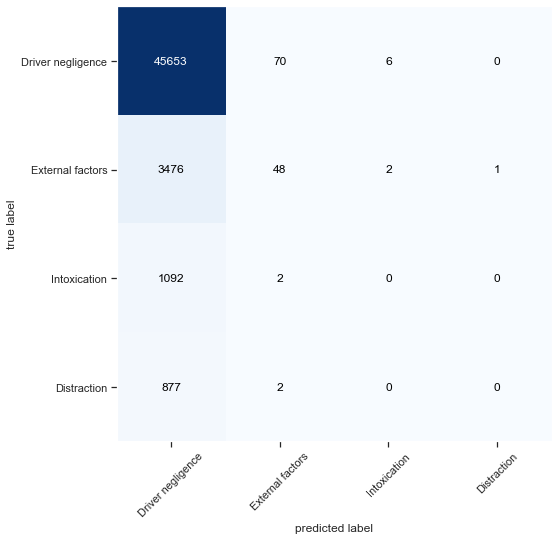

In [22]:
cm = confusion_matrix(y_target=y_test, 
                      y_predicted=y_predict, 
                      binary=False)

labels = ['Driver negligence','External factors','Intoxication','Distraction']
fig, ax = plot_confusion_matrix(conf_mat=cm)
ax.set_xticklabels([''] + labels,rotation=45)
ax.set_yticklabels([''] + labels)

plt.show()

In [23]:
!pip install imblearn

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline 

resampling = SMOTE()

# Define the pipeline, tell it to combine SMOTE with the XGB model
pipeline = Pipeline([('SMOTE', resampling), ('XGBoost', XGBmodel)])

In [1]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline 

resampling = SMOTE()

# Define the pipeline, tell it to combine SMOTE with the XGB model
pipeline = Pipeline([('SMOTE', resampling), ('XGBoost', XGBmodel)])

NameError: name 'XGBmodel' is not defined

In [26]:
import folium
from folium import plugins
from folium.plugins import HeatMap
from IPython.display import HTML, display

map_hooray = folium.Map(location=[41.739685, -87.554420],
                        zoom_start = 13) 

# List comprehension to make out list of lists
    
heat_data = [[row['LATITUDE'],row['LONGITUDE']] for index, row in df2.iterrows()]

# Plot it on the map
HeatMap(heat_data,radius=10,min_opacity=0.01).add_to(map_hooray)

# Display the map
map_hooray